In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from astropy.cosmology import LambdaCDM
from MAS_library import MASL
import base_for_images as bfi

In [2]:
params = {'legend.fontsize': 7,
          'legend.handlelength': 2}
mpl.rcParams['figure.dpi'] = 550
mpl.rcParams['font.family'] = 'serif'
plt.rcParams.update(params)

In [4]:
#cmaps = list(mpl.cm.cmap_d.keys())
cmpsel = ['afmhot', 'cubehelix']

In [28]:
BoxSize=10
mlim = 1e13
zmin, zmax = 100, 150
om0 = 0.25
s8 = 0.7
basefolder = '/home/ayuba/scratch/'
sim = 'm25s7'
cmp = 'cubehelix'


xmin, xmax = 85, 95
ymin, ymax = 80, 90


s = 40
z, pos = bfi.read_pos(basefolder, sim, s)

inds = np.where((pos[:,2]>=zmin) & (pos[:,2]<=zmax) & (pos[:,1]>=ymin) & (pos[:,1]<=ymax) 
                                       & (pos[:,0]>=xmin) & (pos[:,0]<=xmax))[0]
npos = pos[inds]
npos[:,2]-= zmin


0.8207441


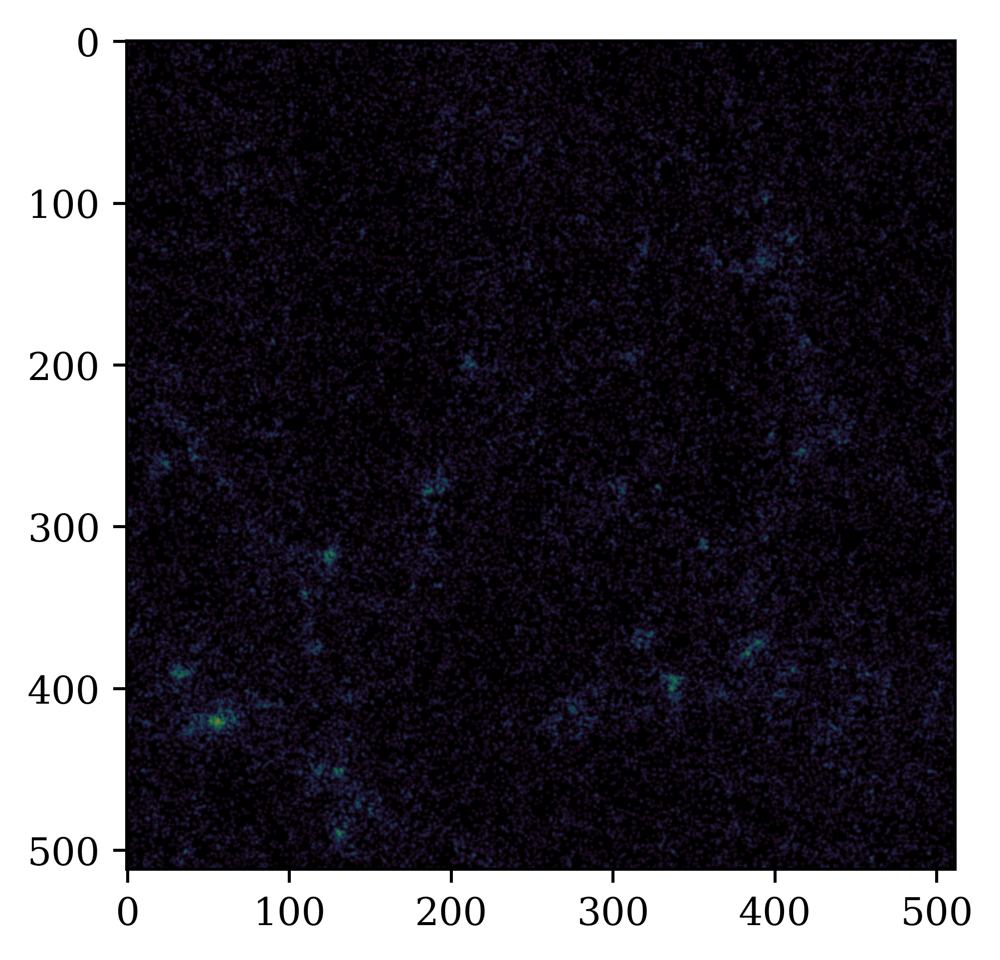

In [29]:
grid = 512
density_field = np.zeros((grid,grid), dtype=np.float32)
MASL.MA(npos[:,0:2].astype(np.float32), density_field, BoxSize, MAS='CIC')
#density_field /= np.mean(density_field)
zr = np.log10(density_field.T+1)
print(np.max(zr))
plt.imshow(zr, interpolation='bicubic', vmax=1.6, cmap=cmp)

# TEST CODE

In [64]:
BoxSize=25
zmin, zmax = 100, 150 
sim = "m25s7"
print(sim)
om0 = bfi.sims[sim][0]
s8 = bfi.sims[sim][1]
cmp = 'cubehelix'
smin = 40
print(smin)
cosmol = LambdaCDM(H0=100 * 0.7, Om0=om0, Ode0=1 - om0)
xmin, xmax = 85, 95
ymin, ymax = 58, 68
xl, yl = 75, 50
vmax = 1.5
#grid = 512
grid = 1500


m25s7
40


(-0.5, 599.5, -0.5, 599.5)

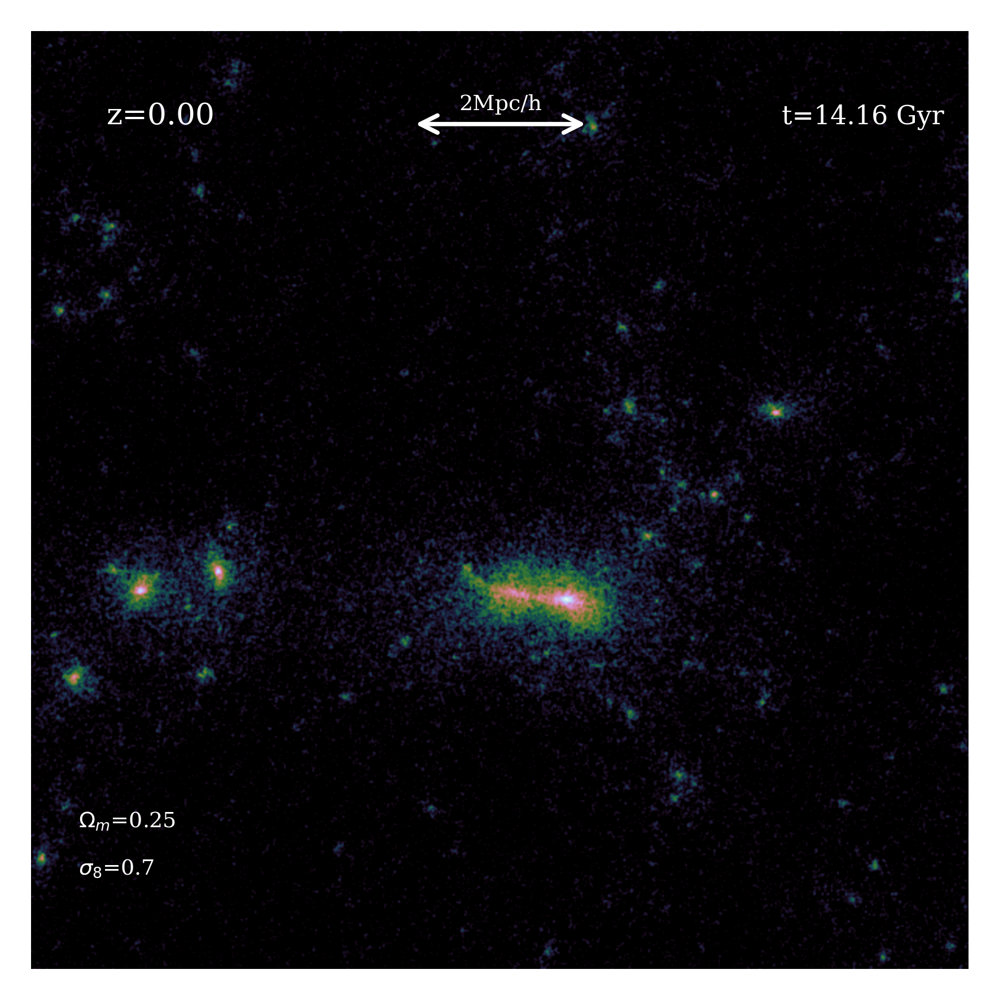

In [65]:
s=118
z, pos = bfi.read_pos(basefolder, sim, s)

inds = np.where((pos[:,2]>=zmin) & (pos[:,2]<=zmax) & (pos[:,1]>=ymin) & (pos[:,1]<=ymax) 
                                   & (pos[:,0]>=xmin) & (pos[:,0]<=xmax))[0]
npos = pos[inds]
npos[:,2]-= zmin

age = cosmol.age(z).value

density_field = np.zeros((grid,grid), dtype=np.float32)

MASL.MA(npos[:,0:2].astype(np.float32), density_field, BoxSize, MAS='CIC')

#density_field /= np.mean(density_field)
sdensity_field = density_field[int(grid*(xmin-xl)/BoxSize):int(grid*(xmax-xl)/BoxSize), int(grid*(ymin-yl)/BoxSize):int(grid*(ymax-yl)/BoxSize)]

zr = np.log10(sdensity_field.T + 1) 

fig1 = plt.figure()
plt.imshow(zr, interpolation='bicubic', vmin=0.05, vmax=vmax, cmap=cmp, origin='lower')
print(np.max(zr))
ngrid = int(grid*(xmax-xmin)/BoxSize)
plt.text(0.08*ngrid, 0.9*ngrid, 'z={:1.2f}'.format(z), color='white', size=7) 
plt.text(0.8*ngrid, 0.9*ngrid, 't={:1.2f} Gyr'.format(age), color='white', size=6)

plt.text(0.05*ngrid, 0.15*ngrid, r'$\Omega_m$={:1.2f}'.format(om0), color='white', size=5)
plt.text(0.05*ngrid, 0.1*ngrid, r'$\sigma_8$={:1.1f}'.format(s8), color='white', size=5)

plt.annotate("", xy=(0.4*ngrid, 0.9*ngrid), xytext=(0.6*ngrid, 0.9*ngrid), arrowprops=dict(arrowstyle='<->', linewidth=1, color='white'))
plt.text(0.5*ngrid, 0.915*ngrid, "2Mpc/h", ha='center', color='white', size=5)

plt.axis('off')

(-0.5, 599.5, -0.5, 599.5)

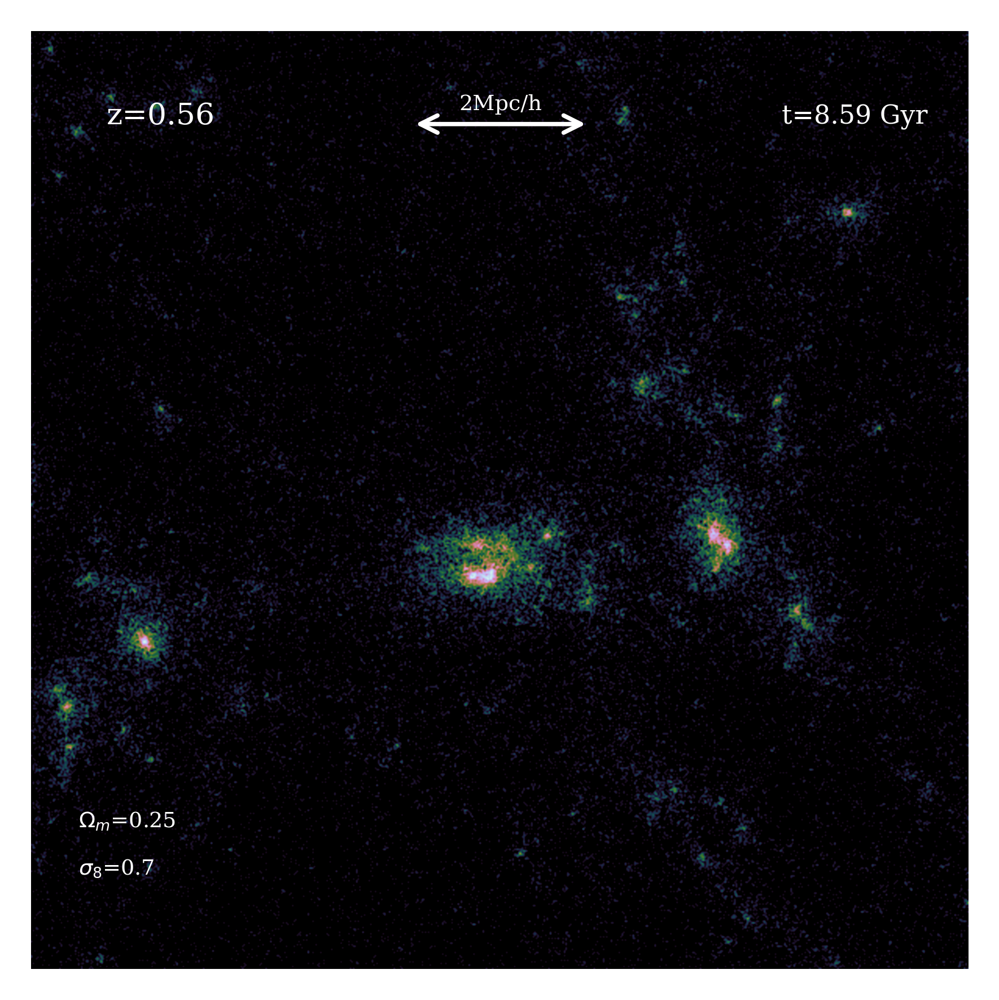

In [63]:
s = 75

z, pos = bfi.read_pos(basefolder, sim, s)

inds = np.where((pos[:,2]>=zmin) & (pos[:,2]<=zmax) & (pos[:,1]>=ymin) & (pos[:,1]<=ymax) 
                                   & (pos[:,0]>=xmin) & (pos[:,0]<=xmax))[0]
npos = pos[inds]
npos[:,2]-= zmin

age = cosmol.age(z).value

density_field = np.zeros((grid,grid), dtype=np.float32)

MASL.MA(npos[:,0:2].astype(np.float32), density_field, BoxSize, MAS='NGP')

#density_field /= np.mean(density_field)

xl, yl = 75, 50
sdensity_field = density_field[int(grid*(xmin-xl)/BoxSize):int(grid*(xmax-xl)/BoxSize), int(grid*(ymin-yl)/BoxSize):int(grid*(ymax-yl)/BoxSize)]
    
zr = np.log10(sdensity_field.T+1)

fig1 = plt.figure()
plt.imshow(zr, interpolation='bicubic', vmin=0.05, cmap=cmp, origin='lower')
ngrid = int(grid*(xmax-xmin)/BoxSize)

plt.text(0.08*ngrid, 0.9*ngrid, 'z={:1.2f}'.format(z), color='white', size=7) 
plt.text(0.8*ngrid, 0.9*ngrid, 't={:1.2f} Gyr'.format(age), color='white', size=6)

plt.text(0.05*ngrid, 0.15*ngrid, r'$\Omega_m$={:1.2f}'.format(om0), color='white', size=5)
plt.text(0.05*ngrid, 0.1*ngrid, r'$\sigma_8$={:1.1f}'.format(s8), color='white', size=5)

plt.annotate("", xy=(0.4*ngrid, 0.9*ngrid), xytext=(0.6*ngrid, 0.9*ngrid), arrowprops=dict(arrowstyle='<->', linewidth=1, color='white'))
plt.text(0.5*ngrid, 0.915*ngrid, "2Mpc/h", ha='center', color='white', size=5)

plt.axis('off')
#fig1.savefig('./snapfigs/zoom_new/zoom{}_{}_bins{}_cmap{}_snap{}_vmax{}.png'.format(BoxSize, sim, grid, cmp, s, vmax), bbox_inches='tight', dpi=1000, transparent=True)
#plt.close(fig1)

(-0.5, 818.5, -0.5, 818.5)

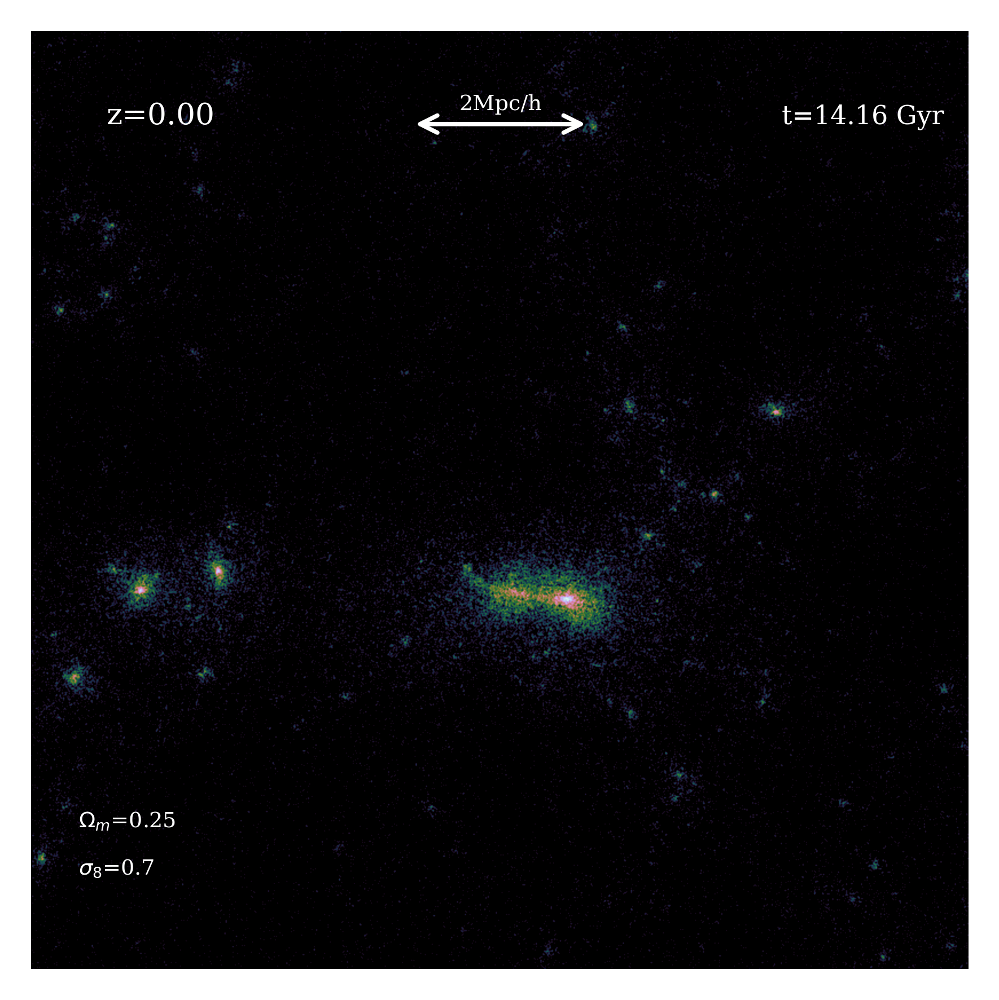

In [54]:
#fig1.savefig('./snapfigs/zoom_new/zoom{}_{}_bins{}_cmap{}_snap{}_vmax{}.png'.format(BoxSize, sim, grid, cmp, s, vmax), bbox_inches='tight', dpi=1000, transparent=True)
#plt.close(fig1)

1.8406864


(-0.5, 408.5, -0.5, 408.5)

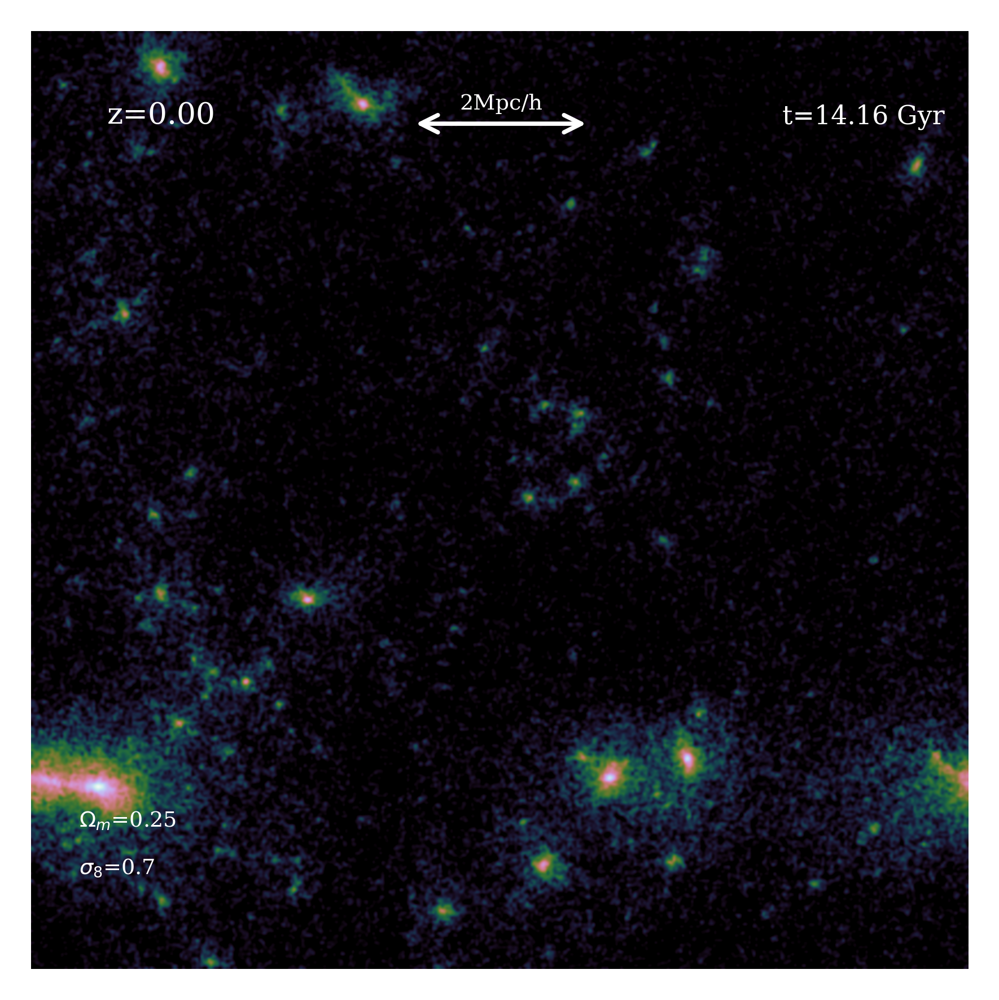

In [10]:
grid = int(2048/5)

density_field = np.zeros((grid,grid), dtype=np.float32)

MASL.MA(npos[:,0:2].astype(np.float32), density_field, BoxSize, MAS='CIC')

#density_field /= np.mean(density_field)

zr = np.log10(density_field.T + 1) 
print(np.max(zr))

fig1 = plt.figure()
plt.imshow(zr, interpolation='bicubic', vmin=0.05, cmap=cmp, origin='lower')

plt.text(0.08*grid, 0.9*grid, 'z={:1.2f}'.format(z), color='white', size=7) 
plt.text(0.8*grid, 0.9*grid, 't={:1.2f} Gyr'.format(age), color='white', size=6)

plt.text(0.05*grid, 0.15*grid, r'$\Omega_m$={:1.2f}'.format(om0), color='white', size=5)
plt.text(0.05*grid, 0.1*grid, r'$\sigma_8$={:1.1f}'.format(s8), color='white', size=5)

plt.annotate("", xy=(0.4*grid, 0.9*grid), xytext=(0.6*grid, 0.9*grid), arrowprops=dict(arrowstyle='<->', linewidth=1, color='white'))
plt.text(0.5*grid, 0.915*grid, "2Mpc/h", ha='center', color='white', size=5)

plt.axis('off')
#fig1.savefig('./snapfigs/zoom_new/zoom{}_{}_bins{}_cmap{}_snap{}_vmax{}.png'.format(BoxSize, sim, grid, cmp, s, vmax), bbox_inches='tight', dpi=1000, transparent=True)
#plt.close(fig1)

1.6125298


(-0.5, 511.5, -0.5, 511.5)

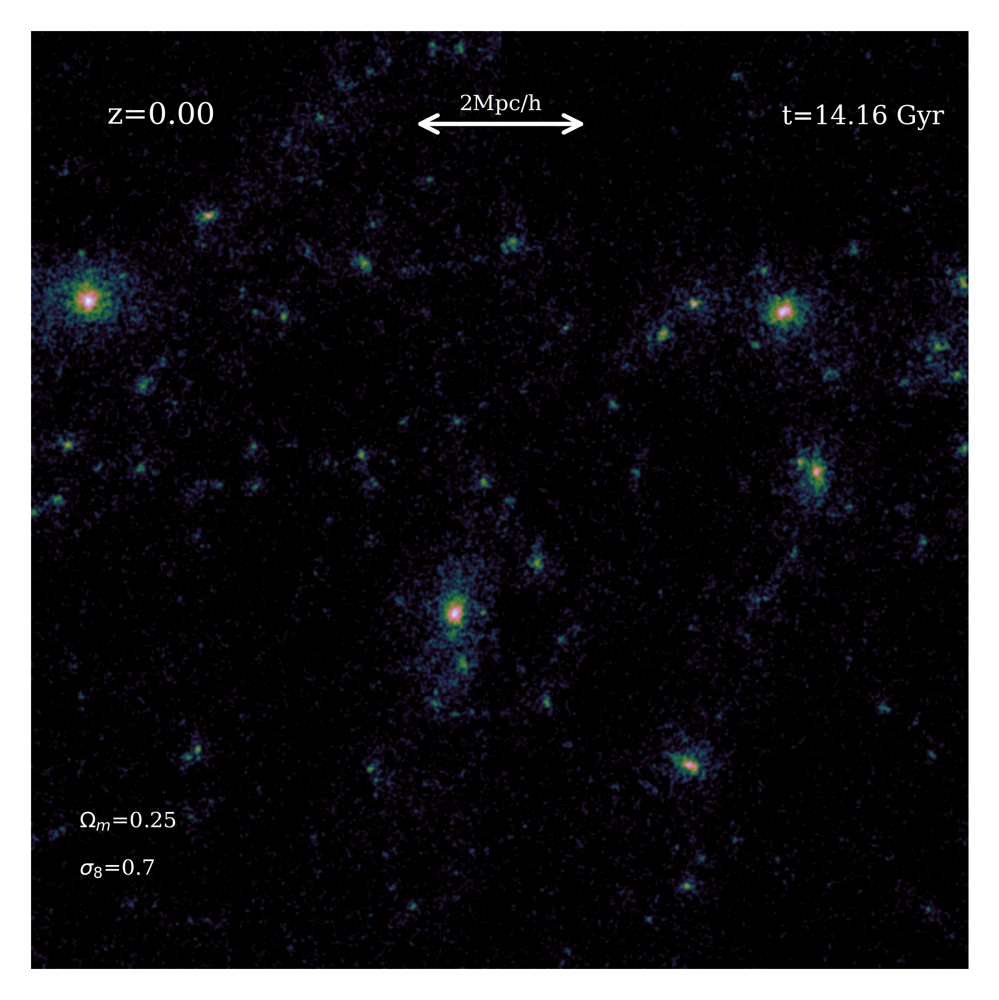

In [8]:
s = 118

z, pos = bfi.read_pos(basefolder, sim, s)

inds = np.where((pos[:,2]>=zmin) & (pos[:,2]<=zmax) & (pos[:,1]>=ymin) & (pos[:,1]<=ymax) 
                                   & (pos[:,0]>=xmin) & (pos[:,0]<=xmax))[0]
npos = pos[inds]
npos[:,2]-= zmin

age = cosmol.age(z).value

density_field = np.zeros((grid,grid), dtype=np.float32)

MASL.MA(npos[:,0:2].astype(np.float32), density_field, BoxSize, MAS='CIC')

#density_field /= np.mean(density_field)

zr = np.log10(density_field.T + 1) 
print(np.max(zr))

fig1 = plt.figure()
plt.imshow(zr, interpolation='bicubic', vmin=0.05, vmax=vmax, cmap=cmp, origin='lower')

plt.text(0.08*grid, 0.9*grid, 'z={:1.2f}'.format(z), color='white', size=7) 
plt.text(0.8*grid, 0.9*grid, 't={:1.2f} Gyr'.format(age), color='white', size=6)

plt.text(0.05*grid, 0.15*grid, r'$\Omega_m$={:1.2f}'.format(om0), color='white', size=5)
plt.text(0.05*grid, 0.1*grid, r'$\sigma_8$={:1.1f}'.format(s8), color='white', size=5)

plt.annotate("", xy=(0.4*grid, 0.9*grid), xytext=(0.6*grid, 0.9*grid), arrowprops=dict(arrowstyle='<->', linewidth=1, color='white'))
plt.text(0.5*grid, 0.915*grid, "2Mpc/h", ha='center', color='white', size=5)

plt.axis('off')
#fig1.savefig('./snapfigs/zoom_new/zoom{}_{}_bins{}_cmap{}_snap{}_vmax{}.png'.format(BoxSize, sim, grid, cmp, s, vmax), bbox_inches='tight', dpi=1000, transparent=True)
#plt.close(fig1)

(-0.5, 511.5, -0.5, 511.5)

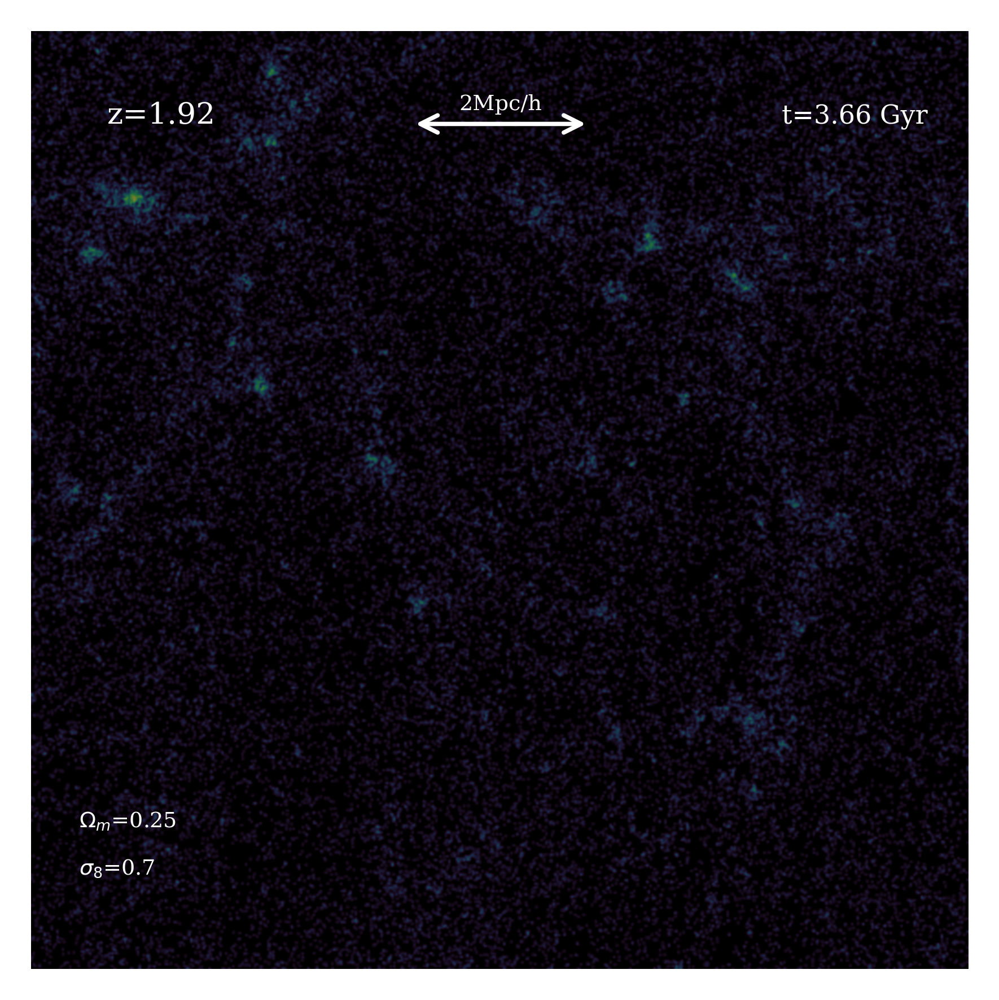

In [11]:
fig1 = plt.figure()
plt.imshow(zr, interpolation='bicubic', vmin=0, vmax=vmax, cmap=cmp, origin='lower')

plt.text(0.08*grid, 0.9*grid, 'z={:1.2f}'.format(z), color='white', size=7) 
plt.text(0.8*grid, 0.9*grid, 't={:1.2f} Gyr'.format(age), color='white', size=6)

plt.text(0.05*grid, 0.15*grid, r'$\Omega_m$={:1.2f}'.format(om0), color='white', size=5)
plt.text(0.05*grid, 0.1*grid, r'$\sigma_8$={:1.1f}'.format(s8), color='white', size=5)

plt.annotate("", xy=(0.4*grid, 0.9*grid), xytext=(0.6*grid, 0.9*grid), arrowprops=dict(arrowstyle='<->', linewidth=1, color='white'))
plt.text(0.5*grid, 0.915*grid, "2Mpc/h", ha='center', color='white', size=5)

plt.axis('off')
#fig1.savefig('./snapfigs/zoom_new/zoom{}_{}_bins{}_cmap{}_snap{}_vmax{}.png'.format(BoxSize, sim, grid, cmp, s, vmax), bbox_inches='tight', dpi=1000, transparent=True)
#plt.close(fig1)